In [85]:
# Importing necessary libraries

import tensorflow as tf
from tensorflow import keras as k
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

from keras.models import Sequential
from keras.layers import Dense,Conv2D,MaxPooling2D,Flatten,Dropout,Activation
from keras.preprocessing.image import ImageDataGenerator as ig
from keras import optimizers
import scipy
import pylab
import matplotlib.cm as cm

In [86]:
# Change location to drive
from google.colab import drive 
drive.mount('/content/drive')
%cd /content/drive/MyDrive

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive


# **Creating Directories**

In [87]:
import os
from os import makedirs
# create directories:
dataset_home='dataset_amazon/'
subdirs=['train/','test/']
for subdir in subdirs:
  #create label subdirectories
  labeldirs =['jeans/','saree/','trousers/']
  for labldir in labeldirs:
    newdir = dataset_home + subdir + labldir
    makedirs(newdir,exist_ok=True)

In [89]:
# Filling created directories with images

from os import listdir
from shutil import copyfile

#create directories:
from random import seed, random
seed(1)

#define ratio of pictures to use for validation
val_ratio=0.20

#copy training dataset images into subdirectories
src_directory='TRAIN_IMG'
dataset_home='dataset_amazon/'
for file in listdir(src_directory):
  src=src_directory + '/' + file
  dst_dir='train/'
  if random()<val_ratio:
    dst_dir='test/'
  if file.startswith('jeans'):
    dst=dataset_home + dst_dir + 'jeans/' + file
    copyfile(src,dst)
  elif file.startswith('saree'):
    dst=dataset_home + dst_dir + 'saree/' + file
    copyfile(src,dst)
  elif file.startswith('trousers'):
    dst=dataset_home + dst_dir + 'trousers/' + file
    copyfile(src,dst)   


In [90]:
# Printing the count of Train and Test Dataset:

print("Count of Training Images")
print("Count of Jeans image in train dataset: ",len(os.listdir('dataset_amazon/train/jeans')))
print("Count of Saree image in train dataset: ",len(os.listdir('dataset_amazon/train/saree')))
print("Count of Trousers image in train dataset: ",len(os.listdir('dataset_amazon/train/trousers')))

print("Count of Test Images")
print("Count of Jeans image in test dataset: ",len(os.listdir('dataset_amazon/test/jeans')))
print("Count of Saree image in test dataset: ",len(os.listdir('dataset_amazon/test/saree')))
print("Count of Trousers image in test dataset: ",len(os.listdir('dataset_amazon/test/trousers')))

Count of Training Images
Count of Jeans image in train dataset:  251
Count of Saree image in train dataset:  249
Count of Trousers image in train dataset:  260
Count of Test Images
Count of Jeans image in test dataset:  66
Count of Saree image in test dataset:  84
Count of Trousers image in test dataset:  63


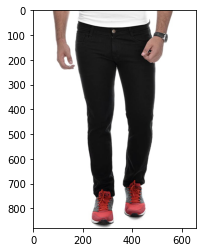

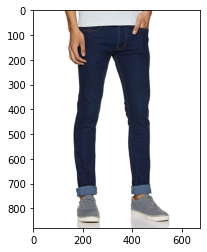

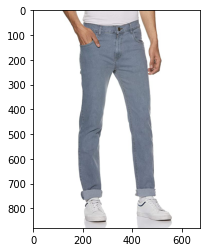

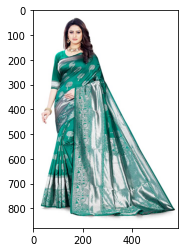

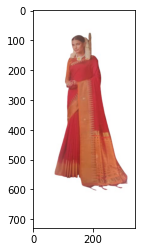

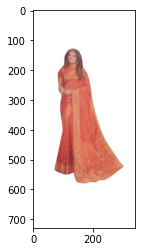

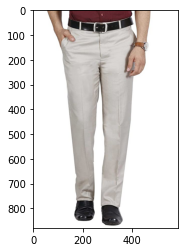

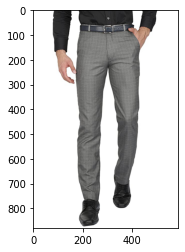

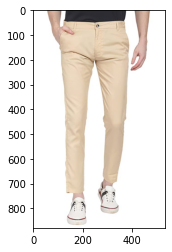

In [94]:
 # Plotting the images:
jeans_train='dataset_amazon/train/jeans'
saree_train='dataset_amazon/train/saree'
trousers_train='dataset_amazon/train/trousers'

Amazon_train=[jeans_train, saree_train, trousers_train]
for i in Amazon_train:
    m=listdir(i)
    for j in m[:3]:
        img=mpimg.imread('{}/{}'.format(i,j))
        plt.imshow(img)
        plt.show()

In [95]:
# Importing libraries:

import pandas as pd
import numpy as np
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout, Activation, Conv2D, MaxPooling2D,BatchNormalization
from tensorflow.keras import optimizers
from keras.models import load_model
from tensorflow.keras.preprocessing import image
import random
import scipy
import pylab as pl
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import warnings 
warnings.filterwarnings("ignore")

In [96]:
#Defining dimensions of images and other parameters
input_shape=(128,128,3)
img_width=128
img_height=128
batch_size=16
epoch=100
train_samples=240
test_samples=63

In [97]:
# Data Augmentation on Training Images

Train_datagen=ImageDataGenerator(rescale=1./255,
                                             zoom_range=0.2,
                                             rotation_range=30,
                                             horizontal_flip=True)
Training_set=Train_datagen.flow_from_directory('dataset_amazon/train',
                                                              target_size=(img_width,img_height),
                                                              batch_size=batch_size, 
                                                              class_mode='categorical')

# Test Data Generator
Test_datagen=ImageDataGenerator(rescale=1./255)
Test_set=Test_datagen.flow_from_directory('dataset_amazon/test',
                                                  target_size=(img_width,img_height),
                                                  batch_size=batch_size, 
                                                  class_mode='categorical')

Found 760 images belonging to 3 classes.
Found 213 images belonging to 3 classes.


In [98]:
# checking indexes of the class

Training_set.class_indices

{'jeans': 0, 'saree': 1, 'trousers': 2}

In [99]:
# checking train data size

t_img,label=Training_set.next()
t_img.shape

(16, 128, 128, 3)

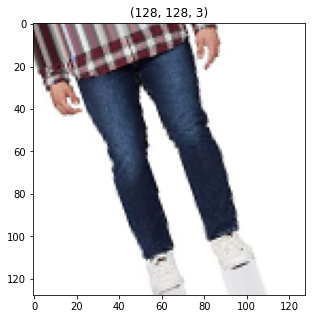

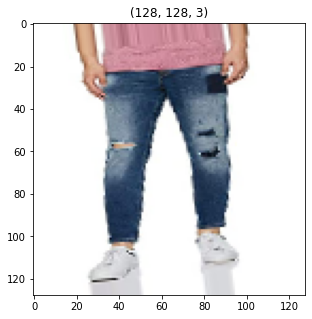

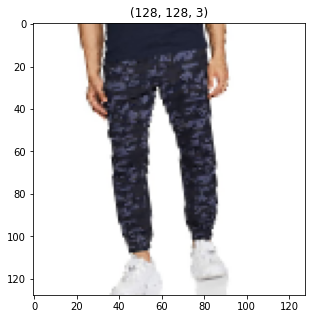

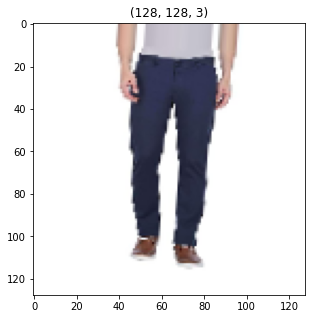

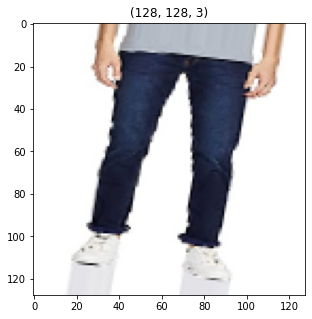

...

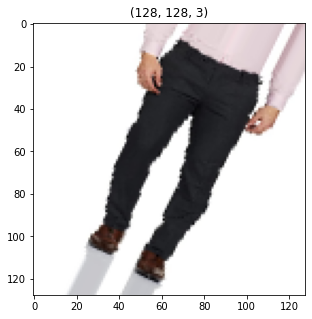

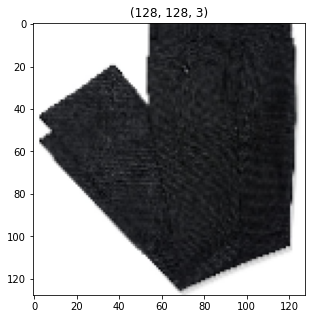

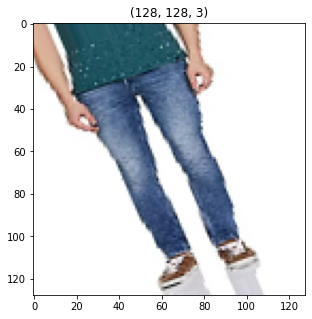

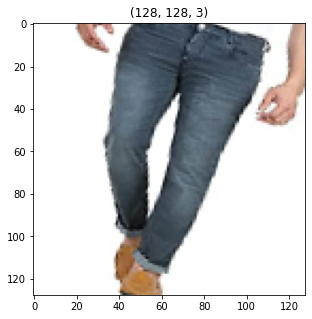

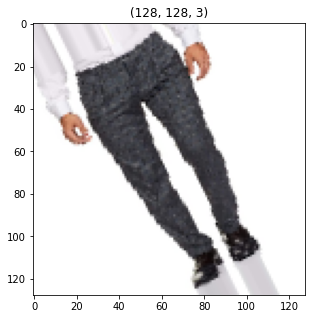

In [101]:
# plotting training images

def plotImage(img_arr,label):
  for idx,img in enumerate(img_arr):
    if idx<=10:
      plt.figure(figsize=(10,5))
      plt.imshow(img)
      plt.title(img.shape)
      plt.axis=False
      plt.show()

plotImage(t_img,label)

# **Preparing a model**:

In [102]:

# Creating the model
model=Sequential()

# First convolution layer
model.add(Conv2D(32,(3,3),input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

# Second convolution layer
model.add(Conv2D(32,(3,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

# Third convolution layer
model.add(Conv2D(64,(3,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

# Fourth convolution layer
model.add(Conv2D(64,(3,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))


model.add(Flatten())
model.add(Dense(128))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(3))
model.add(Activation('softmax'))

print(model.summary())
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_44 (Conv2D)          (None, 126, 126, 32)      896       
                                                                 
 activation_66 (Activation)  (None, 126, 126, 32)      0         
                                                                 
 max_pooling2d_44 (MaxPoolin  (None, 63, 63, 32)       0         
 g2D)                                                            
                                                                 
 dropout_59 (Dropout)        (None, 63, 63, 32)        0         
                                                                 
 conv2d_45 (Conv2D)          (None, 61, 61, 32)        9248      
                                                                 
 activation_67 (Activation)  (None, 61, 61, 32)        0         
                                                     

In [103]:
# Defining Early stopping and Model check point
from keras.callbacks import EarlyStopping , ModelCheckpoint

ES = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=30,min_delta=0.01)
MC = ModelCheckpoint(filepath="./best_modeel.h5", monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)



In [104]:
# Fitting the Training Data
history = model.fit(
    Training_set, 
    epochs=epoch,
    validation_data=Test_set,
    validation_steps=test_samples//batch_size,
    steps_per_epoch=train_samples//batch_size,
    callbacks=[ES,MC])

Epoch 1/100
15/15 [==============================] - ETA: 0s - loss: 1.1646 - accuracy: 0.3417
Epoch 1: val_accuracy improved from -inf to 0.47917, saving model to ./best_modeel.h5
15/15 [==============================] - 11s 647ms/step - loss: 1.1646 - accuracy: 0.3417 - val_loss: 1.0845 - val_accuracy: 0.4792
Epoch 2/100
15/15 [==============================] - ETA: 0s - loss: 1.0904 - accuracy: 0.3833
Epoch 2: val_accuracy did not improve from 0.47917
15/15 [==============================] - 10s 627ms/step - loss: 1.0904 - accuracy: 0.3833 - val_loss: 1.0975 - val_accuracy: 0.2917
Epoch 3/100
15/15 [==============================] - ETA: 0s - loss: 1.0637 - accuracy: 0.3875
Epoch 3: val_accuracy improved from 0.47917 to 0.66667, saving model to ./best_modeel.h5
15/15 [==============================] - 10s 649ms/step - loss: 1.0637 - accuracy: 0.3875 - val_loss: 1.0440 - val_accuracy: 0.6667
Epoch 4/100
15/15 [==============================] - ETA: 0s - loss: 1.0268 - accuracy: 0.461

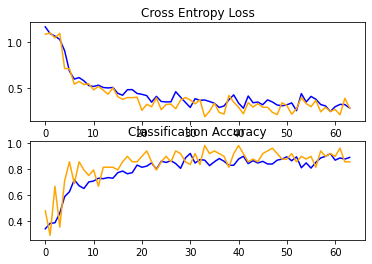

In [105]:
#Plot 
import matplotlib.pyplot as pyplot
import sys
pyplot.subplot(211)
pyplot.title('Cross Entropy Loss')
pyplot.plot(history.history['loss'],color='blue',label='train/')
pyplot.plot(history.history['val_loss'],color='orange',label='test/')

#plot accuracy:
pyplot.subplot(212)
pyplot.title('Classification Accuracy')
pyplot.plot(history.history['accuracy'],color='blue',label='train/')
pyplot.plot(history.history['val_accuracy'],color='orange',label='test/')

# save plot to file:
filename=sys.argv[0].split('/')[-1]
pyplot.savefig(filename + '_plot.png')

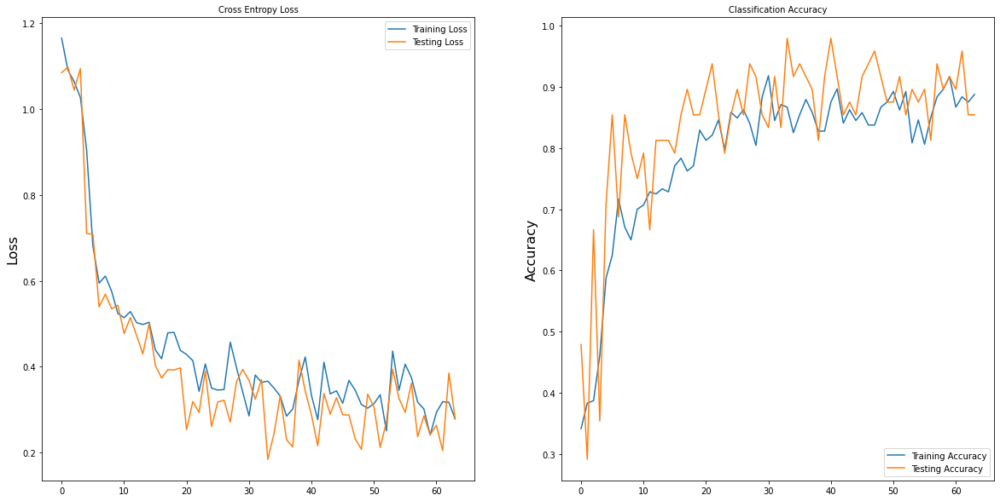

In [106]:
# plot the evolution of Loss and Acuracy on the train and validation sets

import matplotlib.pyplot as plt

plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
plt.title('Cross Entropy Loss',fontsize=10)
plt.ylabel('Loss', fontsize=16)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Testing Loss')
plt.legend(loc='upper right')

plt.subplot(1, 2, 2)
plt.title('Classification Accuracy',fontsize=10)
plt.ylabel('Accuracy', fontsize=16)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Testing Accuracy')
plt.legend(loc='lower right')
plt.show()

In [107]:
#Loading the saved model
saved_model = load_model('best_modeel.h5')

Input Image is: jeans0.jpg


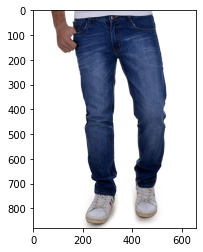

Predicted Label is: [0] 

Input Image is: jeans5.jpg


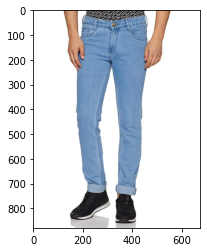

Predicted Label is: [0] 

Input Image is: jeans3.jpg


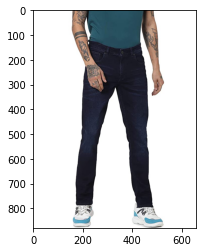

Predicted Label is: [0] 

Input Image is: jeans10.jpg


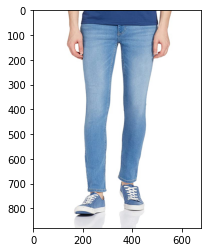

Predicted Label is: [0] 

Input Image is: jeans13.jpg


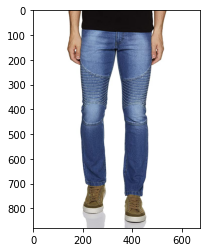

Predicted Label is: [0] 

Input Image is: jeans11.jpg


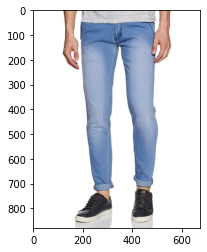

Predicted Label is: [0] 

Input Image is: jeans16.jpg


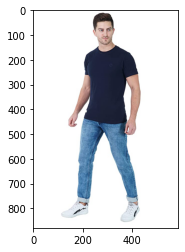

Predicted Label is: [0] 

Input Image is: jeans18.jpg


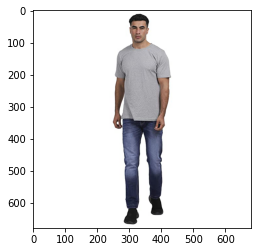

Predicted Label is: [2] 

Input Image is: jeans26.jpg


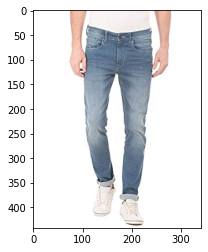

Predicted Label is: [0] 

Input Image is: jeans24.jpg


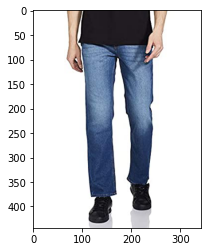

Predicted Label is: [0] 

Input Image is: jeans29.jpg


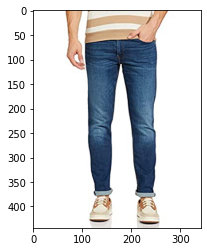

Predicted Label is: [0] 

Input Image is: jeans35.jpg


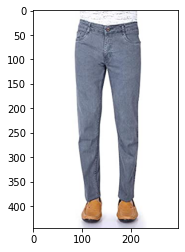

Predicted Label is: [0] 

Input Image is: jeans38.jpg


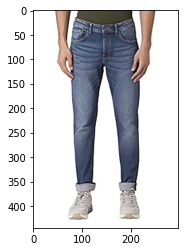

Predicted Label is: [0] 

Input Image is: jeans44.jpg


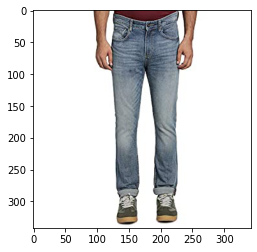

Predicted Label is: [0] 

Input Image is: jeans53.jpg


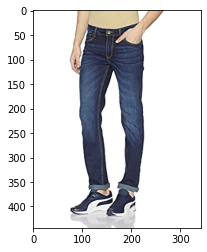

Predicted Label is: [0] 

Input Image is: jeans48.jpg


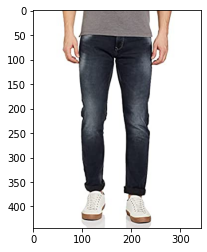

Predicted Label is: [0] 

Input Image is: jeans50.jpg


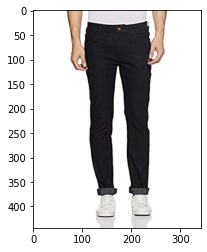

Predicted Label is: [0] 

Input Image is: jeans56.jpg


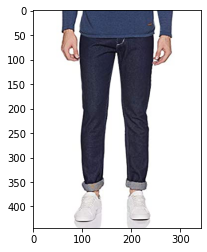

Predicted Label is: [0] 

Input Image is: jeans61.jpg


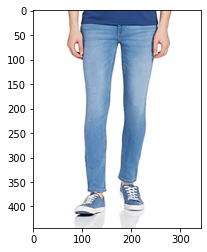

Predicted Label is: [0] 

Input Image is: jeans58.jpg


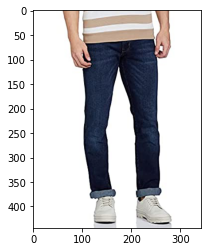

Predicted Label is: [0] 

Input Image is: jeans60.jpg


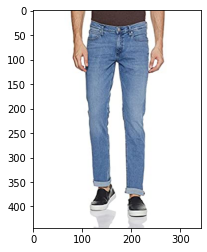

Predicted Label is: [0] 

Input Image is: jeans67.jpg


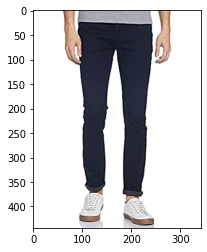

Predicted Label is: [0] 

Input Image is: jeans66.jpg


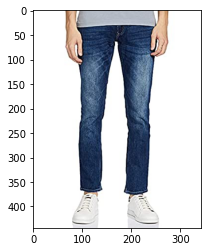

Predicted Label is: [0] 

Input Image is: jeans64.jpg


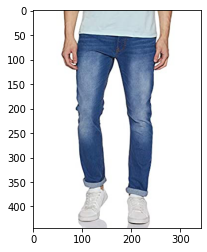

Predicted Label is: [0] 

Input Image is: jeans70.jpg


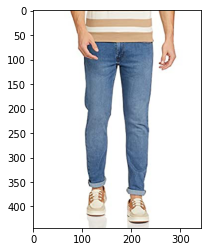

Predicted Label is: [0] 

Input Image is: jeans77.jpg


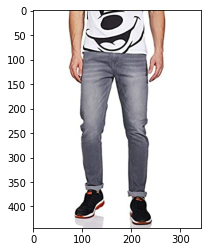

Predicted Label is: [0] 

Input Image is: jeans81.jpg


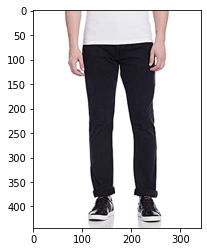

Predicted Label is: [0] 

Input Image is: jeans85.jpg


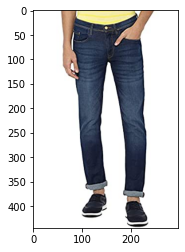

Predicted Label is: [0] 

Input Image is: jeans94.jpg


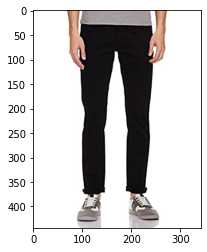

Predicted Label is: [0] 

Input Image is: jeans102.jpg


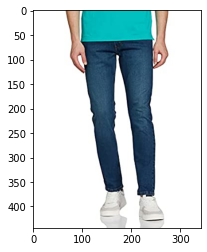

Predicted Label is: [0] 

Input Image is: jeans108.jpg


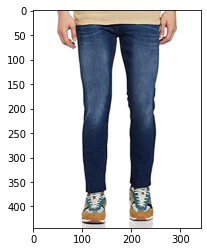

Predicted Label is: [0] 

Input Image is: jeans104.jpg


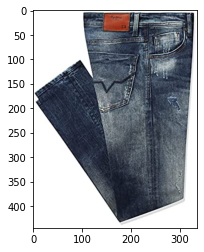

Predicted Label is: [0] 

Input Image is: jeans112.jpg


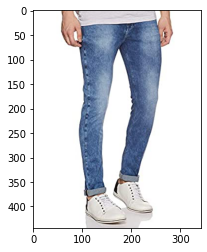

Predicted Label is: [0] 

Input Image is: jeans111.jpg


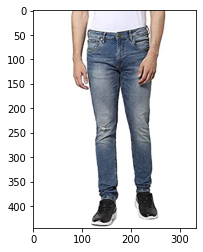

Predicted Label is: [0] 

Input Image is: jeans120.jpg


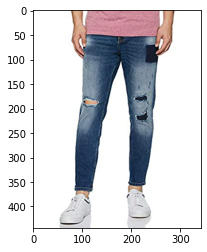

Predicted Label is: [0] 

Input Image is: jeans119.jpg


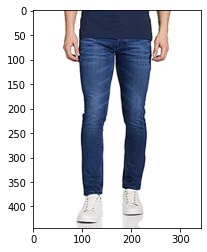

Predicted Label is: [0] 

Input Image is: jeans118.jpg


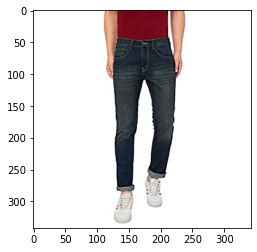

Predicted Label is: [0] 

Input Image is: jeans130.jpg


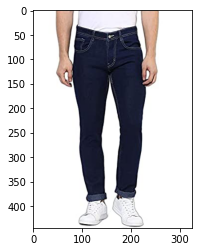

Predicted Label is: [0] 

Input Image is: jeans126.jpg


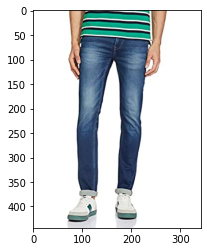

Predicted Label is: [0] 

Input Image is: jeans135.jpg


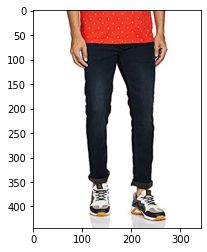

Predicted Label is: [0] 

Input Image is: jeans144.jpg


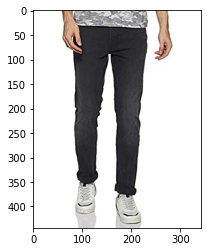

Predicted Label is: [0] 

Input Image is: jeans150.jpg


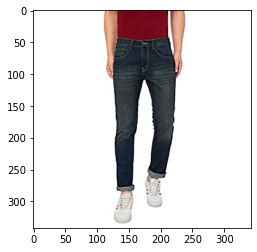

Predicted Label is: [0] 

Input Image is: jeans148.jpg


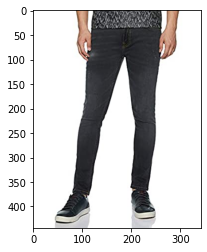

Predicted Label is: [0] 

Input Image is: jeans156.jpg


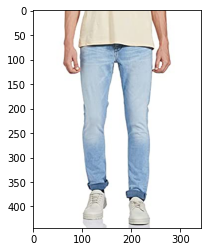

Predicted Label is: [0] 

Input Image is: jeans164.jpg


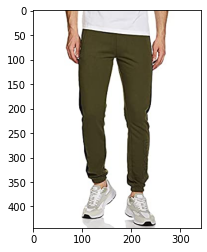

Predicted Label is: [2] 

Input Image is: jeans173.jpg


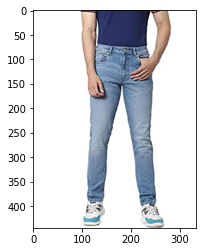

Predicted Label is: [0] 

Input Image is: jeans178.jpg


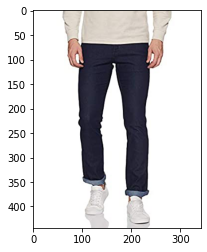

Predicted Label is: [0] 

Input Image is: jeans193.jpg


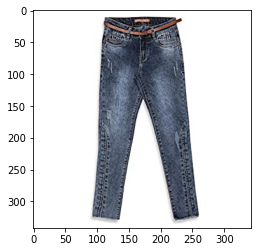

Predicted Label is: [0] 

Input Image is: jeans194.jpg


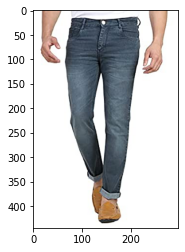

Predicted Label is: [0] 

Input Image is: jeans197.jpg


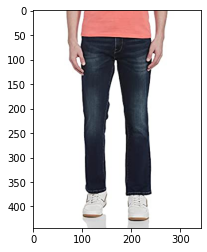

Predicted Label is: [0] 

Input Image is: jeans202.jpg


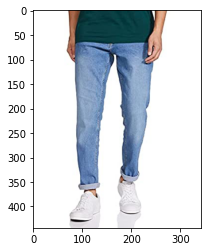

Predicted Label is: [0] 

Input Image is: jeans203.jpg


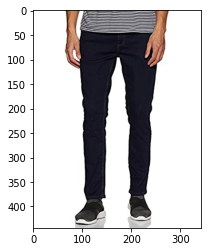

Predicted Label is: [0] 

Input Image is: jeans204.jpg


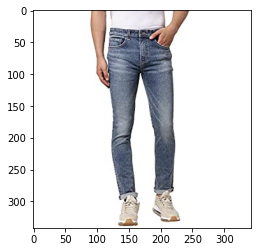

Predicted Label is: [0] 

Input Image is: jeans212.jpg


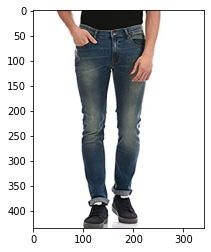

Predicted Label is: [0] 

Input Image is: jeans214.jpg


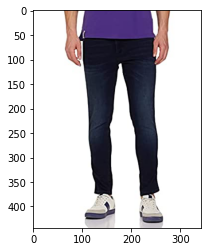

Predicted Label is: [0] 

Input Image is: jeans213.jpg


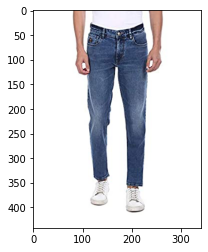

Predicted Label is: [0] 

Input Image is: jeans225.jpg


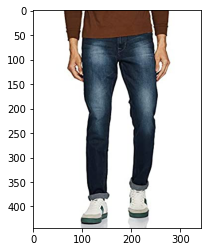

Predicted Label is: [0] 

Input Image is: jeans241.jpg


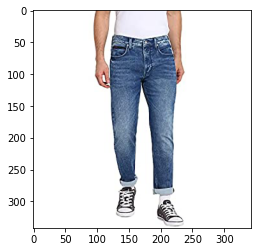

Predicted Label is: [0] 

Input Image is: jeans249.jpg


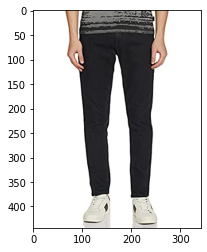

Predicted Label is: [0] 

Input Image is: jeans244.jpg


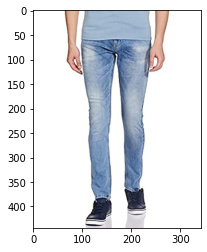

Predicted Label is: [0] 

Input Image is: jeans248.jpg


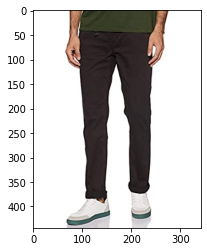

Predicted Label is: [0] 

Input Image is: jeans246.jpg


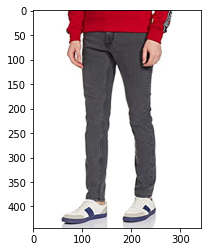

Predicted Label is: [0] 

Input Image is: jeans270.jpg


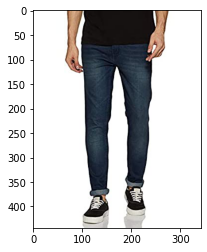

Predicted Label is: [0] 

Input Image is: jeans284.jpg


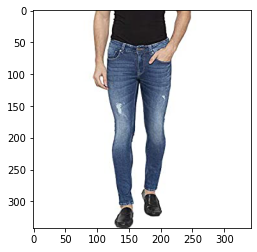

Predicted Label is: [0] 

Input Image is: jeans297.jpg


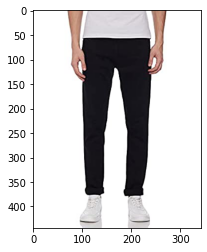

Predicted Label is: [0] 

Input Image is: jeans296.jpg


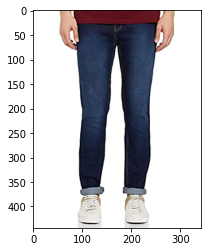

Predicted Label is: [0] 

Input Image is: saree0.jpg


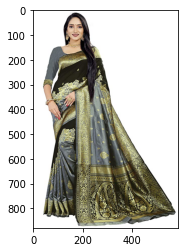

Predicted Label is: [1] 

Input Image is: saree9.jpg


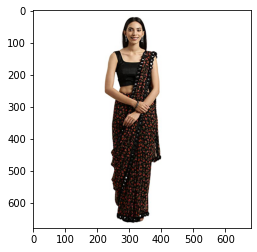

Predicted Label is: [1] 

Input Image is: saree7.jpg


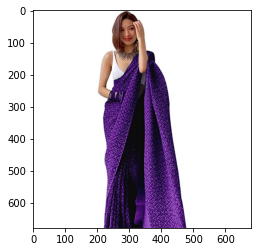

Predicted Label is: [1] 

Input Image is: saree12.jpg


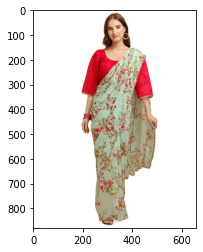

Predicted Label is: [2] 

Input Image is: saree15.jpg


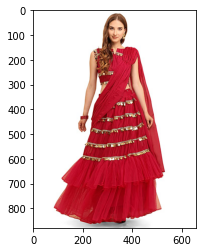

Predicted Label is: [1] 

Input Image is: saree20.jpg


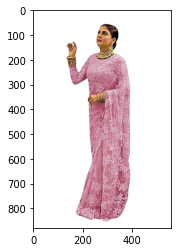

Predicted Label is: [1] 

Input Image is: saree21.jpg


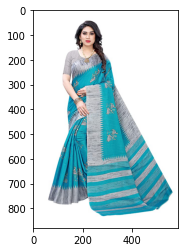

Predicted Label is: [1] 

Input Image is: saree25.jpg


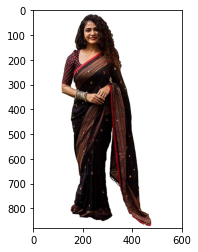

Predicted Label is: [2] 

Input Image is: saree26.jpg


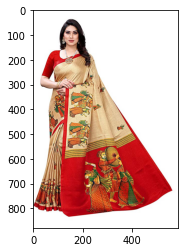

Predicted Label is: [1] 

Input Image is: saree28.jpg


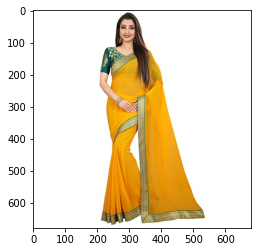

Predicted Label is: [1] 

Input Image is: saree30.jpg


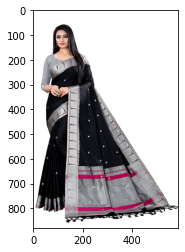

Predicted Label is: [1] 

Input Image is: saree31.jpg


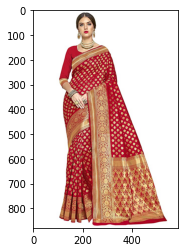

Predicted Label is: [1] 

Input Image is: saree33.jpg


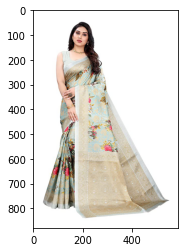

Predicted Label is: [1] 

Input Image is: saree37.jpg


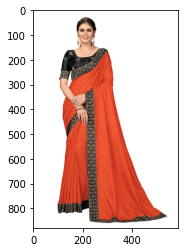

Predicted Label is: [1] 

Input Image is: saree41.jpg


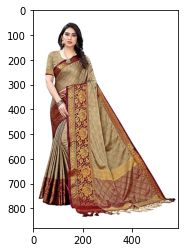

Predicted Label is: [1] 

Input Image is: saree40.jpg


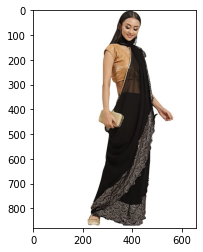

Predicted Label is: [2] 

Input Image is: saree53.jpg


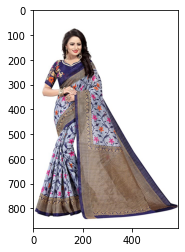

Predicted Label is: [1] 

Input Image is: saree54.jpg


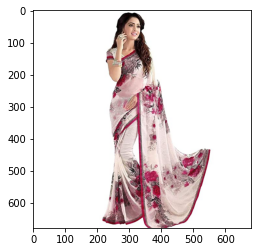

Predicted Label is: [1] 

Input Image is: saree61.jpg


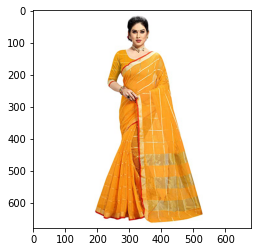

Predicted Label is: [1] 

Input Image is: saree73.jpg


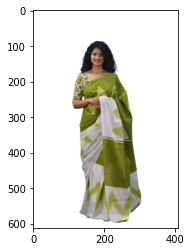

Predicted Label is: [1] 

Input Image is: saree74.jpg


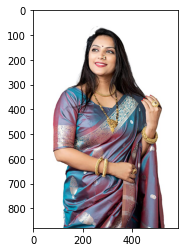

Predicted Label is: [1] 

Input Image is: saree78.jpg


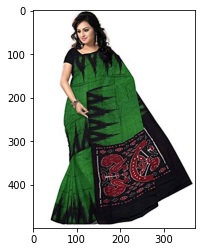

Predicted Label is: [1] 

Input Image is: saree83.jpg


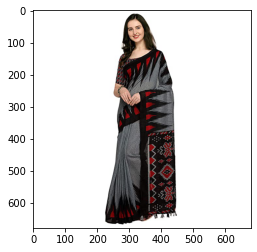

Predicted Label is: [1] 

Input Image is: saree89.jpg


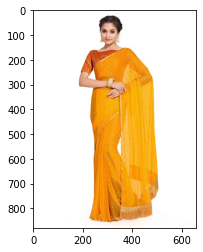

Predicted Label is: [1] 

Input Image is: saree98.jpg


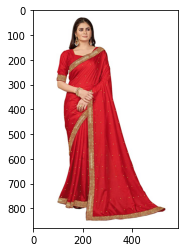

Predicted Label is: [1] 

Input Image is: saree101.jpg


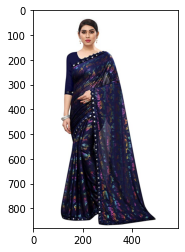

Predicted Label is: [1] 

Input Image is: saree110.jpg


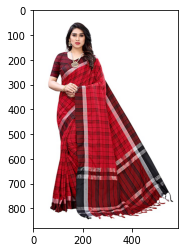

Predicted Label is: [1] 

Input Image is: saree112.jpg


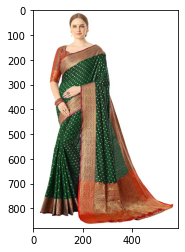

Predicted Label is: [1] 

Input Image is: saree116.jpg


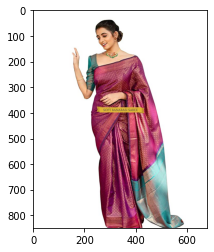

Predicted Label is: [1] 

Input Image is: saree126.jpg


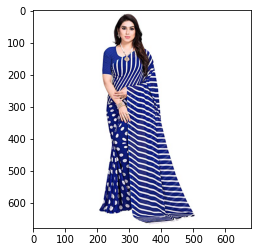

Predicted Label is: [1] 

Input Image is: saree124.jpg


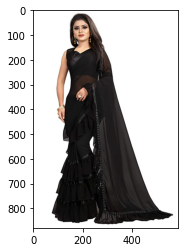

Predicted Label is: [1] 

Input Image is: saree125.jpg


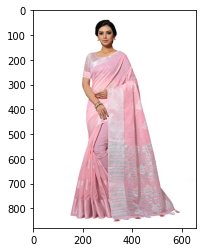

Predicted Label is: [1] 

Input Image is: saree130.jpg


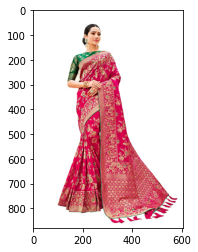

Predicted Label is: [1] 

Input Image is: saree127.jpg


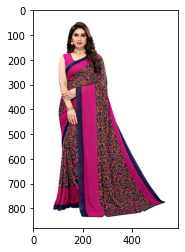

Predicted Label is: [1] 

Input Image is: saree131.jpg


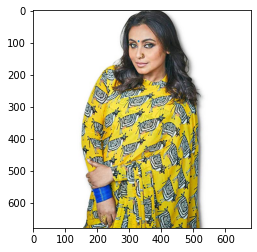

Predicted Label is: [1] 

Input Image is: saree133.jpg


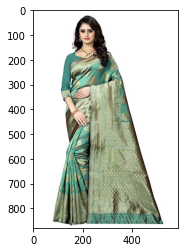

Predicted Label is: [1] 

Input Image is: saree132.jpg


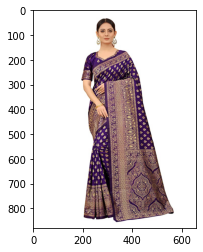

Predicted Label is: [1] 

Input Image is: saree141.jpg


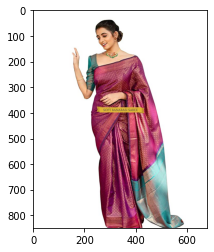

Predicted Label is: [1] 

Input Image is: saree142.jpg


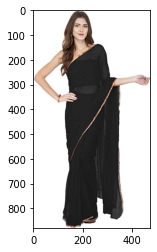

Predicted Label is: [1] 

Input Image is: saree143.jpg


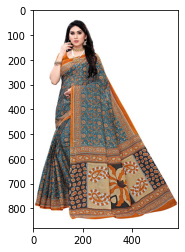

Predicted Label is: [1] 

Input Image is: saree147.jpg


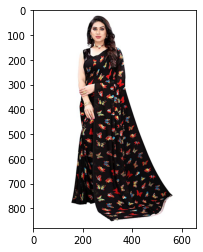

Predicted Label is: [1] 

Input Image is: saree151.jpg


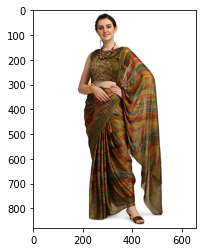

Predicted Label is: [1] 

Input Image is: saree152.jpg


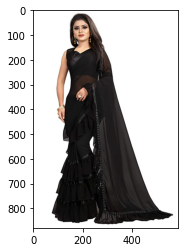

Predicted Label is: [1] 

Input Image is: saree150.jpg


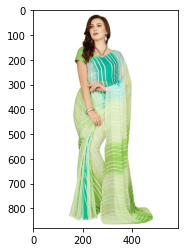

Predicted Label is: [2] 

Input Image is: saree158.jpg


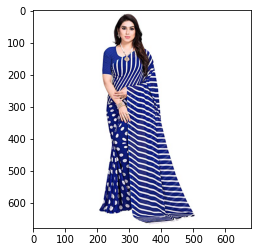

Predicted Label is: [1] 

Input Image is: saree157.jpg


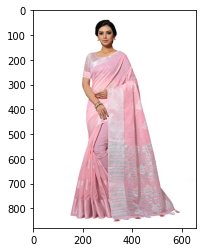

Predicted Label is: [1] 

Input Image is: saree161.jpg


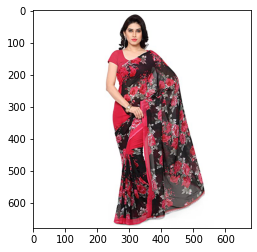

Predicted Label is: [1] 

Input Image is: saree172.jpg


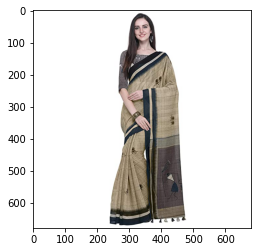

Predicted Label is: [1] 

Input Image is: saree180.jpg


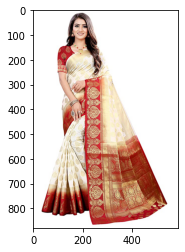

Predicted Label is: [1] 

Input Image is: saree178.jpg


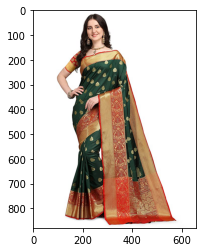

Predicted Label is: [1] 

Input Image is: saree187.jpg


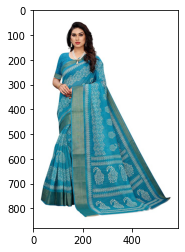

Predicted Label is: [1] 

Input Image is: saree194.jpg


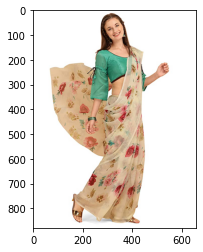

Predicted Label is: [1] 

Input Image is: saree195.jpg


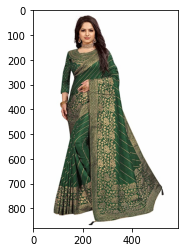

Predicted Label is: [1] 

Input Image is: saree198.jpg


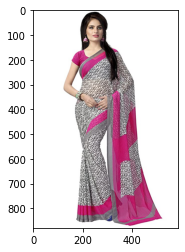

Predicted Label is: [1] 

Input Image is: saree203.jpg


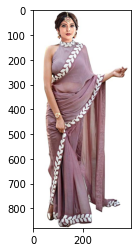

Predicted Label is: [1] 

Input Image is: saree204.jpg


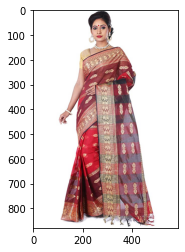

Predicted Label is: [1] 

Input Image is: saree209.jpg


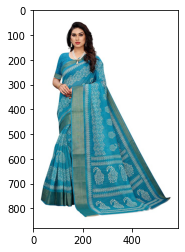

Predicted Label is: [1] 

Input Image is: saree215.jpg


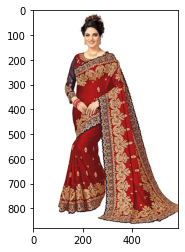

Predicted Label is: [1] 

Input Image is: saree224.jpg


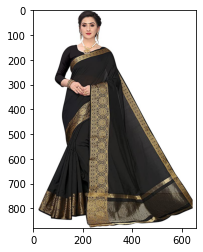

Predicted Label is: [1] 

Input Image is: saree220.jpg


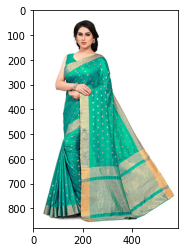

Predicted Label is: [1] 

Input Image is: saree221.jpg


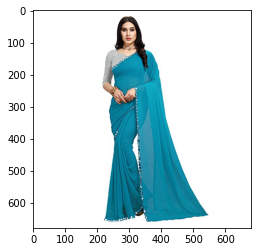

Predicted Label is: [1] 

Input Image is: saree232.jpg


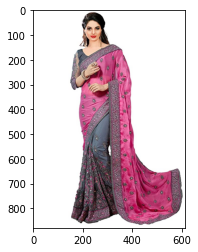

Predicted Label is: [1] 

Input Image is: saree239.jpg


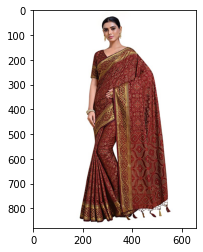

Predicted Label is: [1] 

Input Image is: saree237.jpg


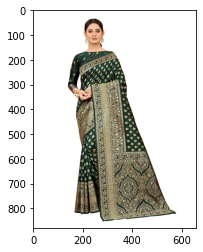

Predicted Label is: [1] 

Input Image is: saree238.jpg


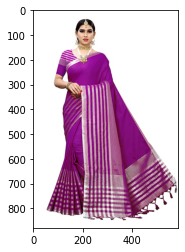

Predicted Label is: [1] 

Input Image is: saree251.jpg


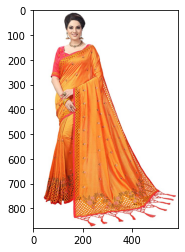

Predicted Label is: [1] 

Input Image is: saree247.jpg


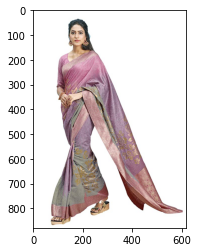

Predicted Label is: [2] 

Input Image is: saree259.jpg


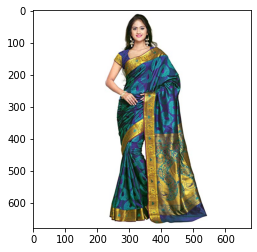

Predicted Label is: [1] 

Input Image is: saree261.jpg


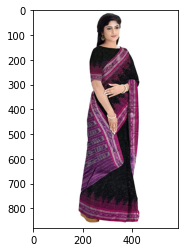

Predicted Label is: [1] 

Input Image is: saree257.jpg


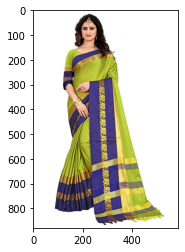

Predicted Label is: [1] 

Input Image is: saree262.jpg


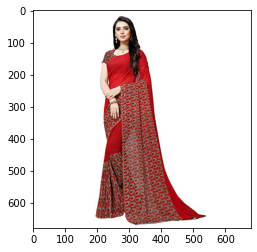

Predicted Label is: [1] 

Input Image is: saree263.jpg


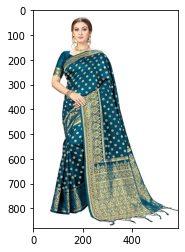

Predicted Label is: [1] 

Input Image is: saree266.jpg


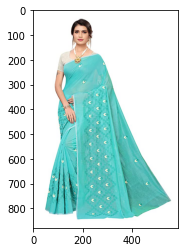

Predicted Label is: [1] 

Input Image is: saree270.jpg


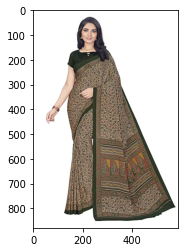

Predicted Label is: [1] 

Input Image is: saree268.jpg


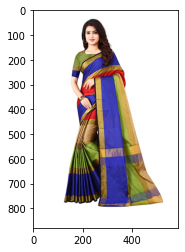

Predicted Label is: [1] 

Input Image is: saree269.jpg


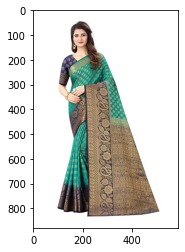

Predicted Label is: [1] 

Input Image is: saree279.jpg


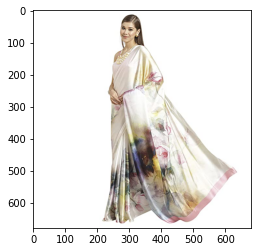

Predicted Label is: [1] 

Input Image is: saree277.jpg


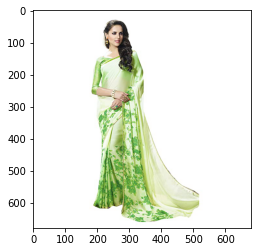

Predicted Label is: [1] 

Input Image is: saree280.jpg


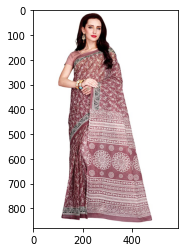

Predicted Label is: [1] 

Input Image is: saree285.jpg


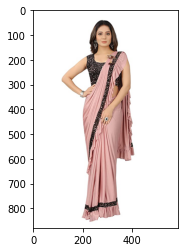

Predicted Label is: [1] 

Input Image is: saree293.jpg


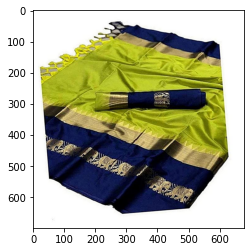

Predicted Label is: [1] 

Input Image is: saree292.jpg


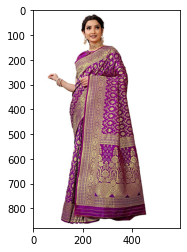

Predicted Label is: [1] 

Input Image is: saree300.jpg


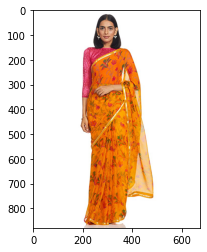

Predicted Label is: [1] 

Input Image is: saree305.jpg


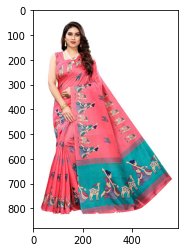

Predicted Label is: [1] 

Input Image is: trousers9.jpg


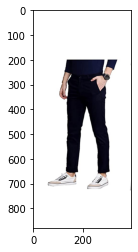

Predicted Label is: [0] 

Input Image is: trousers11.jpg


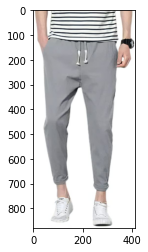

Predicted Label is: [2] 

Input Image is: trousers12.jpg


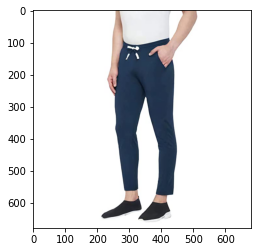

Predicted Label is: [0] 

Input Image is: trousers15.jpg


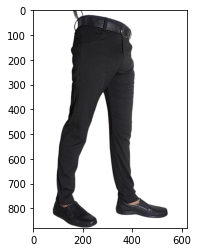

Predicted Label is: [0] 

Input Image is: trousers16.jpg


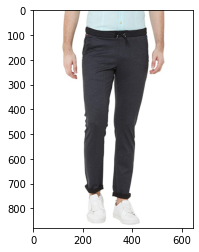

Predicted Label is: [0] 

Input Image is: trousers14.jpg


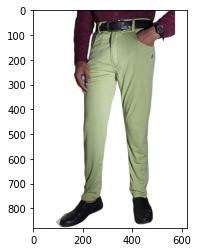

Predicted Label is: [2] 

Input Image is: trousers21.jpg


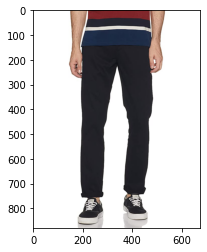

Predicted Label is: [0] 

Input Image is: trousers26.jpg


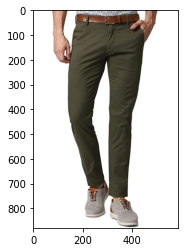

Predicted Label is: [0] 

Input Image is: trousers27.jpg


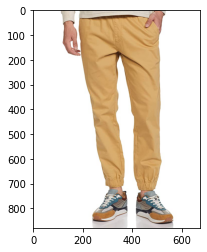

Predicted Label is: [2] 

Input Image is: trousers32.jpg


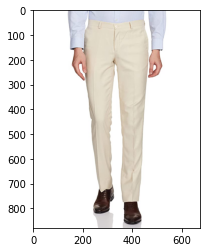

Predicted Label is: [2] 

Input Image is: trousers37.jpg


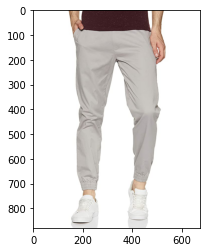

Predicted Label is: [2] 

Input Image is: trousers38.jpg


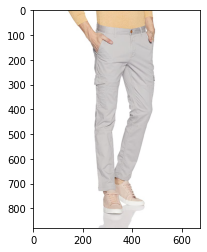

Predicted Label is: [2] 

Input Image is: trousers49.jpg


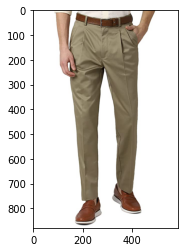

Predicted Label is: [2] 

Input Image is: trousers46.jpg


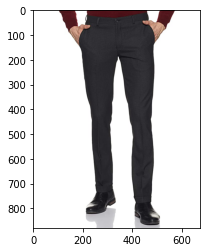

Predicted Label is: [0] 

Input Image is: trousers56.jpg


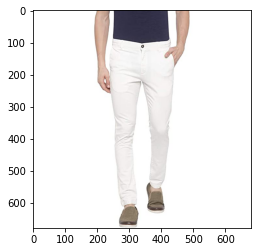

Predicted Label is: [2] 

Input Image is: trousers63.jpg


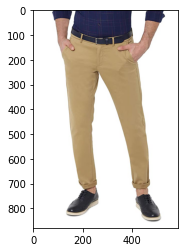

Predicted Label is: [2] 

Input Image is: trousers69.jpg


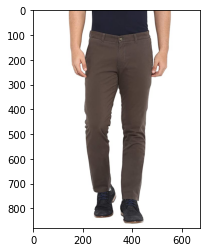

Predicted Label is: [2] 

Input Image is: trousers68.jpg


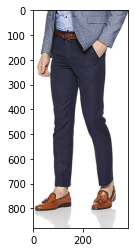

Predicted Label is: [0] 

Input Image is: trousers66.jpg


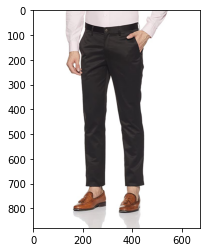

Predicted Label is: [0] 

Input Image is: trousers76.jpg


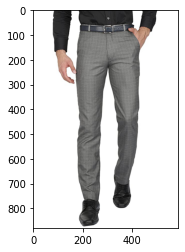

Predicted Label is: [2] 

Input Image is: trousers77.jpg


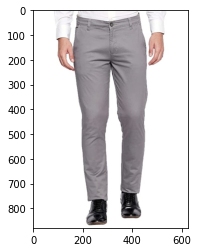

Predicted Label is: [2] 

Input Image is: trousers81.jpg


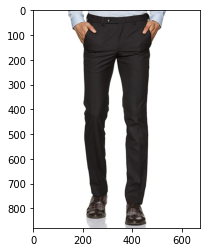

Predicted Label is: [0] 

Input Image is: trousers86.jpg


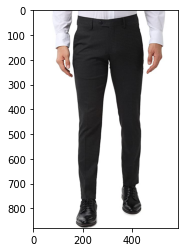

Predicted Label is: [0] 

Input Image is: trousers94.jpg


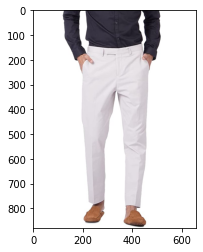

Predicted Label is: [2] 

Input Image is: trousers91.jpg


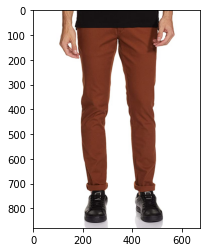

Predicted Label is: [2] 

Input Image is: trousers99.jpg


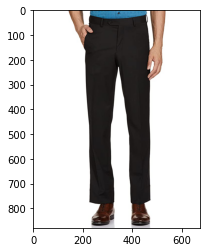

Predicted Label is: [0] 

Input Image is: trousers112.jpg


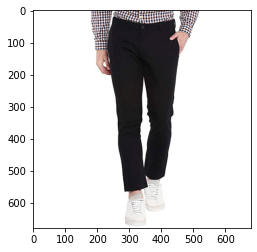

Predicted Label is: [0] 

Input Image is: trousers114.jpg


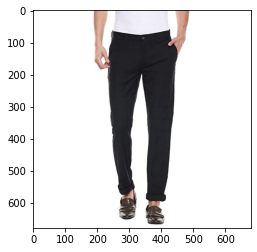

Predicted Label is: [0] 

Input Image is: trousers118.jpg


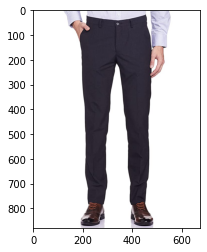

Predicted Label is: [0] 

Input Image is: trousers124.jpg


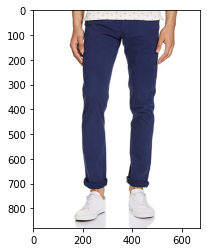

Predicted Label is: [0] 

Input Image is: trousers121.jpg


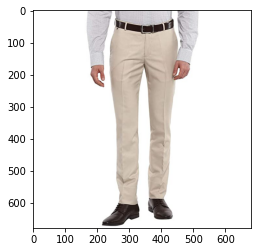

Predicted Label is: [2] 

Input Image is: trousers131.jpg


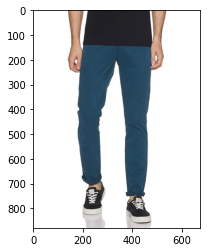

Predicted Label is: [0] 

Input Image is: trousers141.jpg


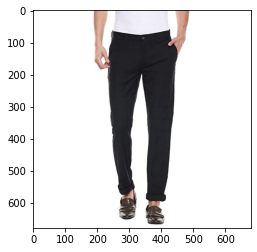

Predicted Label is: [0] 

Input Image is: trousers145.jpg


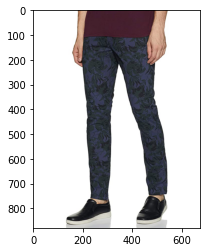

Predicted Label is: [0] 

Input Image is: trousers148.jpg


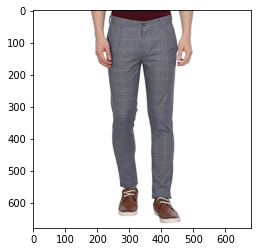

Predicted Label is: [2] 

Input Image is: trousers153.jpg


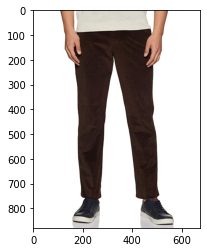

Predicted Label is: [2] 

Input Image is: trousers151.jpg


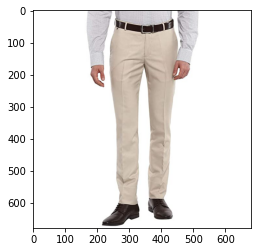

Predicted Label is: [2] 

Input Image is: trousers158.jpg


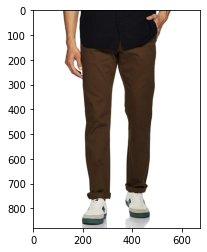

Predicted Label is: [2] 

Input Image is: trousers157.jpg


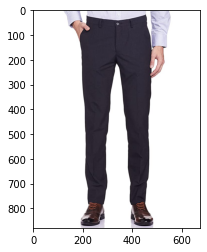

Predicted Label is: [0] 

Input Image is: trousers154.jpg


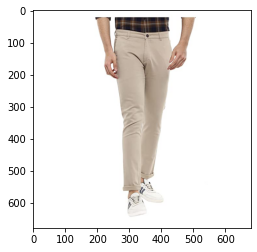

Predicted Label is: [2] 

Input Image is: trousers160.jpg


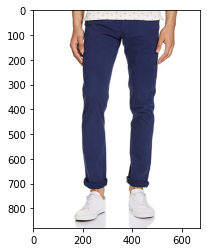

Predicted Label is: [0] 

Input Image is: trousers176.jpg


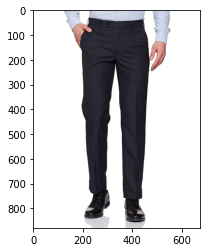

Predicted Label is: [0] 

Input Image is: trousers182.jpg


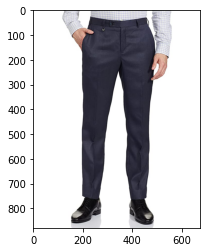

Predicted Label is: [0] 

Input Image is: trousers184.jpg


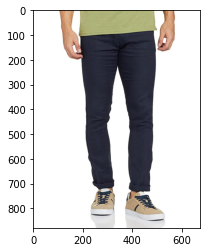

Predicted Label is: [0] 

Input Image is: trousers196.jpg


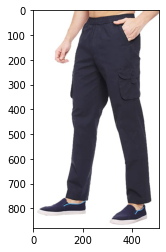

Predicted Label is: [0] 

Input Image is: trousers202.jpg


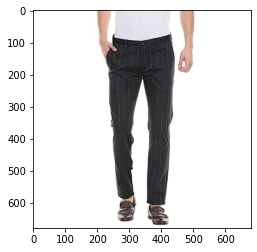

Predicted Label is: [0] 

Input Image is: trousers206.jpg


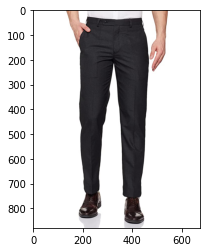

Predicted Label is: [0] 

Input Image is: trousers218.jpg


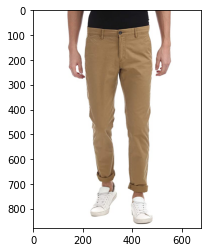

Predicted Label is: [2] 

Input Image is: trousers223.jpg


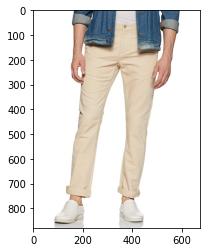

Predicted Label is: [2] 

Input Image is: trousers249.jpg


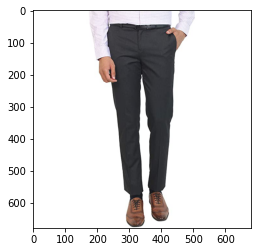

Predicted Label is: [0] 

Input Image is: trousers254.jpg


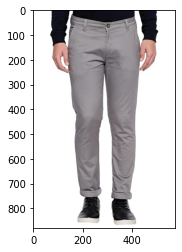

Predicted Label is: [2] 

Input Image is: trousers258.jpg


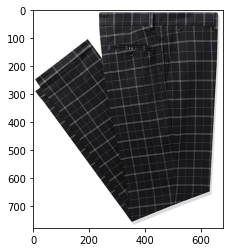

Predicted Label is: [2] 

Input Image is: trousers266.jpg


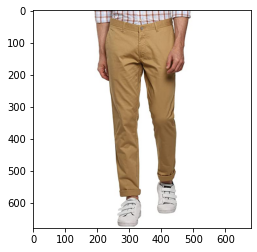

Predicted Label is: [2] 

Input Image is: trousers267.jpg


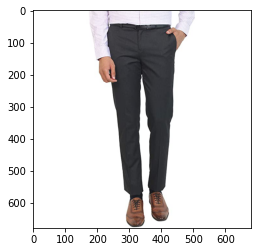

Predicted Label is: [0] 

Input Image is: trousers269.jpg


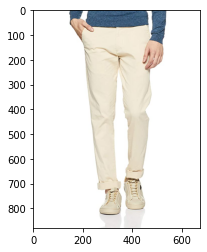

Predicted Label is: [2] 

Input Image is: trousers276.jpg


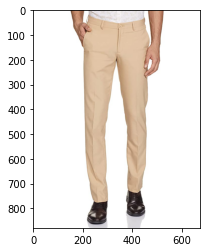

Predicted Label is: [2] 

Input Image is: trousers282.jpg


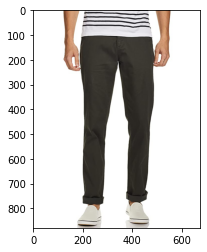

Predicted Label is: [0] 

Input Image is: trousers285.jpg


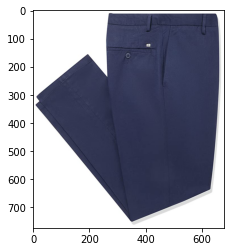

Predicted Label is: [2] 

Input Image is: trousers286.jpg


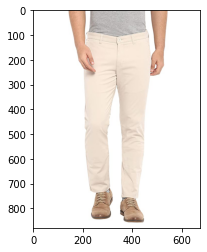

Predicted Label is: [2] 

Input Image is: trousers292.jpg


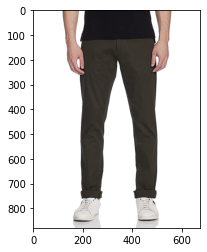

Predicted Label is: [0] 

Input Image is: trousers297.jpg


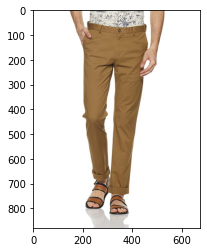

Predicted Label is: [2] 

Input Image is: trousers301.jpg


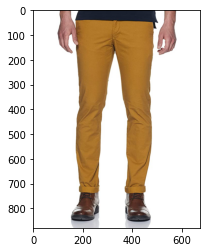

Predicted Label is: [2] 

Input Image is: trousers308.jpg


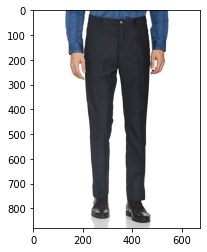

Predicted Label is: [0] 



In [109]:
jeans_test='dataset_amazon/test/jeans'
saree_test='dataset_amazon/test/saree'
trousers_test='dataset_amazon/test/trousers'

test_data=[jeans_test,saree_test,trousers_test]

for testing in test_data:
    for i in listdir(testing):
        print("Input Image is:",i)
        img= image.load_img('{}/{}'.format(testing,i))                         
        test_image = image.load_img('{}/{}'.format(testing,i),target_size=(128, 128))
        test_image = image.img_to_array(test_image)
        plt.imshow(img)
        plt.show()
        test_image = np.expand_dims(test_image, axis=0)
        result = saved_model.predict(test_image)
        print("Predicted Label is:",np.argmax(result, axis=1),"\n")

In [127]:
# compute predictions
predictions = saved_model.predict_generator(generator=Test_set)
y_pred = [np.argmax(probas) for probas in predictions]
y_test = Test_set.classes
class_names = Test_set.class_indices.keys()

In [129]:
#converting prediction to readable form
Train_result=Test_set.filenames
preds=[]
for i in y_pred:
    if i==0:
        preds.append('Jeans')
    elif i==1:
        preds.append('Sarees')
    else:
        preds.append('Trousers')

real=[]
for i in y_test:
    if i==0:
        real.append('Jeans')
    elif i==1:
        real.append('Sarees')
    else:
        real.append('Trousers')  
        
Output=pd.DataFrame({})
Output['Image']=Train_result
Output['Actual value']=real
Output['Predicted value']=preds


Output

,Image,Actual value,Predicted value
0,jeans/jeans0.jpg,Jeans,Sarees
1,jeans/jeans10.jpg,Jeans,Sarees
2,jeans/jeans102.jpg,Jeans,Sarees
3,jeans/jeans104.jpg,Jeans,Trousers
4,jeans/jeans108.jpg,Jeans,Jeans
...,...,...,...
208,trousers/trousers86.jpg,Trousers,Sarees
209,trousers/trousers9.jpg,Trousers,Jeans
210,trousers/trousers91.jpg,Trousers,Jeans
211,trousers/trousers94.jpg,Trousers,Sarees


In [131]:
#saving prediction to csv
Output.to_csv('Predictedvalue.csv')